## Intro til geopandas

### Hva er geopandas?

Geopandas er en python-pakke ala arcpy og pyqgis.

GIS-biten er basert på de samme algoritmene som i QGIS, POSTGIS osv. (fra GEOS, GDAL og PROJ).

Det som ikke har med GIS å gjøre er basert på pakken pandas.

### Hvordan fungerer pandas (og Python)?

#### Verdier

In [1]:
tall = 6
tall

6

In [2]:
tekst = "0301"
tekst

'0301'

#### Lister med verdier

In [3]:
liste = [tekst, "1101", "1103", "1106", "1108"]
liste

['0301', '1101', '1103', '1106', '1108']

In [4]:
liste2 = [tall, 3, 8, 24, 11]
liste2

[6, 3, 8, 24, 11]

Lister, som tekstfiler, kan loopes gjennom:

In [5]:
for kommnr, tall in zip(liste, liste2):
    print(tall, "* 2 =", tall * 2)
    print(f"ferdig med k{kommnr}")

6 * 2 = 12
ferdig med k0301
3 * 2 = 6
ferdig med k1101
8 * 2 = 16
ferdig med k1103
24 * 2 = 48
ferdig med k1106
11 * 2 = 22
ferdig med k1108


In [6]:
liste[0] = "3401"

liste

['3401', '1101', '1103', '1106', '1108']

#### Ordbøker (dictionary)

De består av nøkkel-verdi-par (key-value pairs)
- verdier i (for eksempel) lister
- nøkler som lar deg hente verdiene

In [7]:
# ordbok = {"nøkkel": verdier}

NameError: name 'verdier' is not defined

In [8]:
ordbok = {"KOMMUNENR": liste, "tall": liste2}
ordbok

{'KOMMUNENR': ['3401', '1101', '1103', '1106', '1108'],
 'tall': [6, 3, 8, 24, 11]}

In [9]:
ordbok["KOMMUNENR"]

['3401', '1101', '1103', '1106', '1108']

In [10]:
ordbok["tall"]

[6, 3, 8, 24, 11]

### det er dette som utgjør en pandas.DataFrame

In [11]:
import pandas as pd

In [12]:
pd.DataFrame(ordbok)

,KOMMUNENR,tall
0,3401,6
1,1101,3
2,1103,8
3,1106,24
4,1108,11


Altså:

In [13]:
df = pd.DataFrame({
    "KOMMUNENR": ['4601', '1101', '1103', '1106', '1108'],
    "tall": [6, 3, 8, 24, 11]
})
df

,KOMMUNENR,tall
0,4601,6
1,1101,3
2,1103,8
3,1106,24
4,1108,11


Sånn her refererer man til en kolonne:

In [14]:
ordbok["tall"]

[6, 3, 8, 24, 11]

In [15]:
df["tall"]

0     6
1     3
2     8
3    24
4    11
Name: tall, dtype: int64

In [16]:
df["tall"] + 100

0    106
1    103
2    108
3    124
4    111
Name: tall, dtype: int64

Lage ny kolonne:

In [17]:
df["tall_pluss_100"] = df["tall"] + 100
df

,KOMMUNENR,tall,tall_pluss_100
0,4601,6,106
1,1101,3,103
2,1103,8,108
3,1106,24,124
4,1108,11,111


Man kan også referere til kolonner med punktum (men det funker ikke å lage en ny kolonne på denne måten):

In [18]:
df.tall

0     6
1     3
2     8
3    24
4    11
Name: tall, dtype: int64

### geopandas

In [19]:
import geopandas as gpd

C:\Users\ort\AppData\Local\Temp\ipykernel_11672\3841419929.py:1: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


Les geodata:

In [20]:
veger = gpd.read_file("C:/users/ort/namibia/roads_oslo_2020.gpkg")
veger

,traffic_per_day,speed_limit,roadtype,bridge,tunnel,municipality,geometry
0,5.086812,30,K,0,0,0301,"LINESTRING (264428.800 6660601.970, 264426.510..."
1,10.173623,30,K,0,0,0301,"LINESTRING (265904.131 6644537.702, 265942.621..."
2,10.096893,30,K,0,0,0301,"LINESTRING (261473.700 6650780.800, 261477.060..."
3,1.017362,30,K,0,0,0301,"LINESTRING (270551.267 6651700.294, 270557.649..."
4,10.173623,30,K,0,0,0301,"LINESTRING (256149.500 6650711.400, 256159.700..."
...,...,...,...,...,...,...,...
13226,98578.000000,80,E,1,0,0301,"LINESTRING (270398.124 6651558.120, 270410.319..."
13227,98578.000000,80,E,1,0,0301,"LINESTRING (270413.502 6651546.876, 270418.669..."
13228,127801.000000,50,R,0,0,0301,"LINESTRING (260769.400 6649207.600, 260770.848..."
13229,127801.000000,50,R,0,0,0301,"LINESTRING (260847.878 6649214.850, 260845.650..."


Man kan også velge hvilke kolonner og rader man vil lese og fjerne Z-koordinater:

c:\Users\ort\Anaconda3\envs\geo_env311\Lib\site-packages\pyogrio\core.py:21: RuntimeWarning: Could not detect GDAL data files.  Set GDAL_DATA environment variable to the correct path.
  _init_gdal_data()
c:\Users\ort\Anaconda3\envs\geo_env311\Lib\site-packages\pyogrio\core.py:22: RuntimeWarning: Could not detect PROJ data files.  Set PROJ_LIB environment variable to the correct path.
  _init_proj_data()


292
292


,roadtype,traffic_per_day,geometry
0,R,505.854358,"LINESTRING (269863.938 6652696.216, 269859.067..."
1,R,505.854358,"LINESTRING (269863.938 6652696.216, 269859.067..."
2,R,505.854358,"LINESTRING (269866.867 6652697.492, 269863.938..."
3,R,505.854358,"LINESTRING (269866.867 6652697.492, 269863.938..."
4,R,505.854358,"LINESTRING (269851.500 6652692.300, 269830.100..."
...,...,...,...
287,R,43734.000000,"LINESTRING (272962.901 6651336.516, 272965.579..."
288,R,51210.000000,"LINESTRING (273227.000 6650999.400, 273233.900..."
289,R,51210.000000,"LINESTRING (273255.500 6650995.900, 273255.000..."
290,R,51210.000000,"LINESTRING (273237.077 6650998.788, 273240.054..."


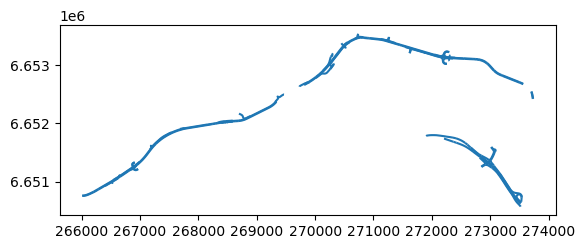

In [21]:
import pyogrio
veger2 = gpd.read_file("C:/users/ort/namibia/roads_oslo_2020.gpkg", 
                      
                       engine = "pyogrio",
                       
                       columns = ["traffic_per_day", "roadtype"],
                      
                       where = "speed_limit >= 80 and roadtype == 'R'",
                      
                       force_2d = True,
                     )

# sjekk om det gir samme resultat som vanlig utvelgelse:
print(len(veger2))
print(len(veger.loc[(veger.speed_limit >= 80) & (veger.roadtype=='R'), ["traffic_per_day", "roadtype"]]))

veger2.plot()
veger2

Og man kan lese kun et område, for eksempel 500 meter rundt SSB i Akersveien:

In [22]:
from shapely.wkt import loads
akersveien = gpd.GeoDataFrame({"geometry": gpd.GeoSeries(loads("POINT (10.7476913 59.9222196)"))}, crs=4326).to_crs(25833)
akersveien["geometry"] = akersveien.buffer(500)
akersveien.explore()

In [23]:
veger = gpd.read_file("C:/users/ort/namibia/roads_oslo_2020.gpkg", 
                      engine = "pyogrio",
                      bbox = akersveien
                     )
veger.explore()

Men nå vil jeg ha alle veger:

<AxesSubplot: >

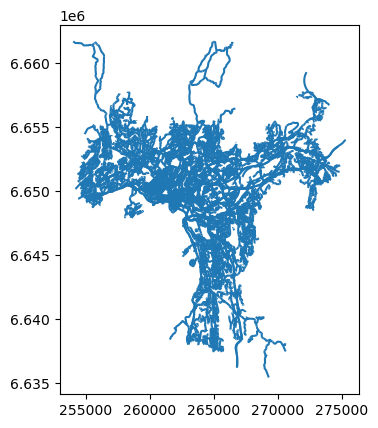

In [24]:
veger = gpd.read_file("C:/users/ort/namibia/roads_oslo_2020.gpkg")
veger.plot()

<AxesSubplot: >

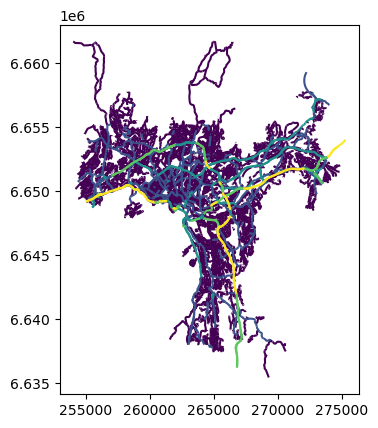

In [25]:
veger.plot("traffic_per_day", scheme="NaturalBreaks")

<AxesSubplot: ylabel='Frequency'>

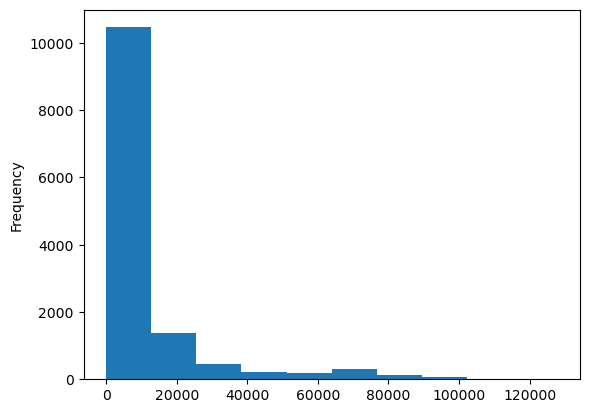

In [26]:
veger["traffic_per_day"].plot.hist()

In [27]:
veger["traffic_per_day"].describe()

count     13231.000000
mean      10001.076366
std       17807.724689
min           1.011709
25%         505.854358
50%        2524.223344
75%       10864.796405
max      127801.000000
Name: traffic_per_day, dtype: float64

### Syntaksen i (geo)pandas er som regel enten:

- data.attributt

- data.metode()

- data.kolonne.attributt

- data.kolonne.metode()

En attributt inneholder informasjon om dataene.

In [28]:
veger.columns # liste over kolonnene

Index(['traffic_per_day', 'speed_limit', 'roadtype', 'bridge', 'tunnel',
       'municipality', 'geometry'],
      dtype='object')

In [29]:
veger.shape # antall rader og kolonner

(13231, 7)

In [30]:
veger.traffic_per_day

0             5.086812
1            10.173623
2            10.096893
3             1.017362
4            10.173623
             ...      
13226     98578.000000
13227     98578.000000
13228    127801.000000
13229    127801.000000
13230    127801.000000
Name: traffic_per_day, Length: 13231, dtype: float64

In [31]:
veger.length # = Shape_Leng

0         82.390976
1         38.554546
2         73.216237
3         33.077028
4         42.720896
            ...    
13226     18.150059
13227     17.843207
13228     82.762118
13229     90.264295
13230    289.928014
Length: 13231, dtype: float64

In [32]:
veger["traffic_per_km"] = veger.traffic_per_day / (veger.length / 1000)
veger.head()

,traffic_per_day,speed_limit,roadtype,bridge,tunnel,municipality,geometry,traffic_per_km
0,5.086812,30,K,0,0,0301,"LINESTRING (264428.800 6660601.970, 264426.510...",61.739912
1,10.173623,30,K,0,0,0301,"LINESTRING (265904.131 6644537.702, 265942.621...",263.876099
2,10.096893,30,K,0,0,0301,"LINESTRING (261473.700 6650780.800, 261477.060...",137.905112
3,1.017362,30,K,0,0,0301,"LINESTRING (270551.267 6651700.294, 270557.649...",30.757368
4,10.173623,30,K,0,0,0301,"LINESTRING (256149.500 6650711.400, 256159.700...",238.141616


In [33]:
veger.area # = Shape_Area

0        0.0
1        0.0
2        0.0
3        0.0
4        0.0
        ... 
13226    0.0
13227    0.0
13228    0.0
13229    0.0
13230    0.0
Length: 13231, dtype: float64

Dette var attributter, altså info om dataene våre.

Metoder innebærer å gjøre endringer i dataene.

In [34]:
veger.buffer(10)

0        POLYGON ((264380.693 6660626.836, 264382.511 6...
1        POLYGON ((265942.043 6644549.915, 265943.024 6...
2        POLYGON ((261485.070 6650782.257, 261491.127 6...
3        POLYGON ((270554.428 6651711.907, 270568.811 6...
4        POLYGON ((256152.494 6650728.934, 256152.810 6...
                               ...                        
13226    POLYGON ((270406.400 6651572.515, 270410.903 6...
13227    POLYGON ((270414.685 6651558.247, 270420.623 6...
13228    POLYGON ((260761.688 6649214.917, 260762.101 6...
13229    POLYGON ((260842.299 6649206.548, 260832.583 6...
13230    POLYGON ((261116.651 6649301.417, 261112.641 6...
Length: 13231, dtype: geometry

In [35]:
veger.buffer(10).area

0        1957.985972
1        1084.745765
2        1777.979341
3         975.194806
4        1168.071663
            ...     
13226     676.656035
13227     670.518945
13228    1966.890024
13229    2118.277799
13230    6111.971063
Length: 13231, dtype: float64

In [36]:
veger.groupby("roadtype").mean(numeric_only = True)

,traffic_per_day,speed_limit,bridge,tunnel,traffic_per_km
roadtype,,,,,
E,36630.888655,68.826406,0.359413,0.154645,2.345169e+06
F,8875.893126,52.833333,0.154167,0.045833,4.853759e+05
K,3668.210912,36.478544,0.031218,0.001119,2.534004e+05
R,22480.412288,66.660092,0.293886,0.088757,1.726628e+06


In [37]:
summary_statistics = veger.groupby("roadtype").agg(
    
    traffic_per_day_sum = ('traffic_per_day','sum'), # kolonnenavn og aggregeringsmetode i tuple, altså med vanlig parentes
    
    speed_limit_mean = ('speed_limit','mean'),
    
    municipality = ('municipality','first')
    
)
summary_statistics

,traffic_per_day_sum,speed_limit_mean,municipality
roadtype,,,
E,5.992813e+07,68.826406,0301
F,2.130214e+06,52.833333,3020
K,3.607319e+07,36.478544,0301
R,3.419271e+07,66.660092,0301


In [38]:
summary_stats_mange = veger.groupby("roadtype").agg({
    
    "traffic_per_day": ("mean", "sum", "max", "min", "median"),
    
    "speed_limit": ["mean", "sum", "max", "min", "median"],
    
    "municipality": 'first'

})
summary_stats_mange

traffic_per_day                                          \
                    mean           sum           max         min   
roadtype                                                           
E           36630.888655  5.992813e+07  127801.00000  102.756035   
F            8875.893126  2.130214e+06   23997.00000  620.000000   
K            3668.210912  3.607319e+07   66473.12672    1.011709   
R           22480.412288  3.419271e+07  127801.00000   90.438261   

                       speed_limit                        municipality  
                median        mean     sum max min median        first  
roadtype                                                                
E         24767.020215   68.826406  112600  80  30   70.0         0301  
F          7520.000000   52.833333   12680  80  40   50.0         3020  
K          1009.689338   36.478544  358730  80  20   30.0         0301  
R         19380.000000   66.660092  101390  90  40   70.0         0301

### Velg kolonner

In [39]:
kolonner_du_vil_beholde = ["traffic_per_day", "traffic_per_km", "geometry"]

veger2 = veger[kolonner_du_vil_beholde]

veger2.head()

,traffic_per_day,traffic_per_km,geometry
0,5.086812,61.739912,"LINESTRING (264428.800 6660601.970, 264426.510..."
1,10.173623,263.876099,"LINESTRING (265904.131 6644537.702, 265942.621..."
2,10.096893,137.905112,"LINESTRING (261473.700 6650780.800, 261477.060..."
3,1.017362,30.757368,"LINESTRING (270551.267 6651700.294, 270557.649..."
4,10.173623,238.141616,"LINESTRING (256149.500 6650711.400, 256159.700..."


Samme som over, men på én linje:

In [40]:
veger2 = veger[["traffic_per_day", "traffic_per_km", "geometry"]]
veger2.head()

,traffic_per_day,traffic_per_km,geometry
0,5.086812,61.739912,"LINESTRING (264428.800 6660601.970, 264426.510..."
1,10.173623,263.876099,"LINESTRING (265904.131 6644537.702, 265942.621..."
2,10.096893,137.905112,"LINESTRING (261473.700 6650780.800, 261477.060..."
3,1.017362,30.757368,"LINESTRING (270551.267 6651700.294, 270557.649..."
4,10.173623,238.141616,"LINESTRING (256149.500 6650711.400, 256159.700..."


Man kan fjerne kolonner med drop():

In [41]:
veger2 = veger.drop(["speed_limit", "tunnel", "bridge", "roadtype", "municipality"], 
                    axis=1) # axis=1 betyr at man vil fjerne kolonner, axis=0 betyr rader
veger2.head()

,traffic_per_day,geometry,traffic_per_km
0,5.086812,"LINESTRING (264428.800 6660601.970, 264426.510...",61.739912
1,10.173623,"LINESTRING (265904.131 6644537.702, 265942.621...",263.876099
2,10.096893,"LINESTRING (261473.700 6650780.800, 261477.060...",137.905112
3,1.017362,"LINESTRING (270551.267 6651700.294, 270557.649...",30.757368
4,10.173623,"LINESTRING (256149.500 6650711.400, 256159.700...",238.141616


### Velg rader

In [42]:
veger2 = veger.loc[veger.traffic_per_day > 1000]

veger2.traffic_per_day.min()

1000.68371835

Samme som:

In [43]:
veger2 = veger.query("traffic_per_day > 1000")

Man spør Python om kolonneverdiene er større enn 1000

In [44]:
2000 > 1000

True

In [45]:
500 > 1000

False

Dette gjøres for hver rad:

In [46]:
veger.traffic_per_day > 1000

0        False
1        False
2        False
3        False
4        False
         ...  
13226     True
13227     True
13228     True
13229     True
13230     True
Name: traffic_per_day, Length: 13231, dtype: bool

Og så velger man ut radene som er True

In [47]:
veger[veger.traffic_per_day > 1000]

,traffic_per_day,speed_limit,roadtype,bridge,tunnel,municipality,geometry,traffic_per_km
4943,1002.981916,30,K,0,0,3024,"LINESTRING (255661.100 6649162.600, 255663.600...",1.502174e+04
4944,1001.895663,30,K,0,0,3029,"LINESTRING (272970.950 6649761.420, 272972.760...",1.080705e+04
4945,1002.659402,30,K,0,0,0301,"LINESTRING (264501.413 6653016.574, 264507.201...",5.404803e+04
4946,1000.683718,30,K,0,0,0301,"LINESTRING (268663.780 6651877.070, 268681.708...",1.632337e+04
4947,1002.981916,30,K,0,0,3024,"LINESTRING (254831.800 6651610.800, 254822.500...",4.509219e+03
...,...,...,...,...,...,...,...,...
13226,98578.000000,80,E,1,0,0301,"LINESTRING (270398.124 6651558.120, 270410.319...",5.431277e+06
13227,98578.000000,80,E,1,0,0301,"LINESTRING (270413.502 6651546.876, 270418.669...",5.524680e+06
13228,127801.000000,50,R,0,0,0301,"LINESTRING (260769.400 6649207.600, 260770.848...",1.544197e+06
13229,127801.000000,50,R,0,0,0301,"LINESTRING (260847.878 6649214.850, 260845.650...",1.415853e+06


In [48]:
veger2 = veger.query("traffic_per_day > 1000 | roadtype == 'E' & tunnel == 0")
veger2

,traffic_per_day,speed_limit,roadtype,bridge,tunnel,municipality,geometry,traffic_per_km
143,102.756035,50,E,0,0,0301,"LINESTRING (263566.500 6641060.900, 263566.750...",3.612169e+02
146,105.511305,80,E,1,0,0301,"LINESTRING (267174.603 6638456.049, 267178.633...",1.001996e+04
147,105.511305,80,E,0,0,0301,"LINESTRING (267233.819 6638461.242, 267237.144...",3.305442e+03
162,105.511305,80,E,0,0,0301,"LINESTRING (267237.342 6638497.040, 267239.825...",1.928380e+04
163,105.511305,80,E,0,0,0301,"LINESTRING (267237.342 6638497.040, 267239.825...",1.928380e+04
...,...,...,...,...,...,...,...,...
13226,98578.000000,80,E,1,0,0301,"LINESTRING (270398.124 6651558.120, 270410.319...",5.431277e+06
13227,98578.000000,80,E,1,0,0301,"LINESTRING (270413.502 6651546.876, 270418.669...",5.524680e+06
13228,127801.000000,50,R,0,0,0301,"LINESTRING (260769.400 6649207.600, 260770.848...",1.544197e+06
13229,127801.000000,50,R,0,0,0301,"LINESTRING (260847.878 6649214.850, 260845.650...",1.415853e+06


### Velg rader og kolonner samtidig

Inni loc kan man velge først rader, så et komma og så kan man velge kolonner:

In [49]:
veger2 = veger.loc[veger.traffic_per_day > 1000, ["traffic_per_day", "traffic_per_km", "geometry"]]
veger2

,traffic_per_day,traffic_per_km,geometry
4943,1002.981916,1.502174e+04,"LINESTRING (255661.100 6649162.600, 255663.600..."
4944,1001.895663,1.080705e+04,"LINESTRING (272970.950 6649761.420, 272972.760..."
4945,1002.659402,5.404803e+04,"LINESTRING (264501.413 6653016.574, 264507.201..."
4946,1000.683718,1.632337e+04,"LINESTRING (268663.780 6651877.070, 268681.708..."
4947,1002.981916,4.509219e+03,"LINESTRING (254831.800 6651610.800, 254822.500..."
...,...,...,...
13226,98578.000000,5.431277e+06,"LINESTRING (270398.124 6651558.120, 270410.319..."
13227,98578.000000,5.524680e+06,"LINESTRING (270413.502 6651546.876, 270418.669..."
13228,127801.000000,1.544197e+06,"LINESTRING (260769.400 6649207.600, 260770.848..."
13229,127801.000000,1.415853e+06,"LINESTRING (260847.878 6649214.850, 260845.650..."


Velg trafikk over 1000 eller europaveger som ikke er tunneller.

Og velg kolonner som inneholder ordene 'traffic' eller 'geometry'.

In [50]:
veger2 = veger.loc[(veger.traffic_per_day > 1000) | (veger.roadtype == 'E') & (veger.tunnel == 0),                    
                   veger.columns.str.contains('traffic|geometry')]
veger2

,traffic_per_day,geometry,traffic_per_km
143,102.756035,"LINESTRING (263566.500 6641060.900, 263566.750...",3.612169e+02
146,105.511305,"LINESTRING (267174.603 6638456.049, 267178.633...",1.001996e+04
147,105.511305,"LINESTRING (267233.819 6638461.242, 267237.144...",3.305442e+03
162,105.511305,"LINESTRING (267237.342 6638497.040, 267239.825...",1.928380e+04
163,105.511305,"LINESTRING (267237.342 6638497.040, 267239.825...",1.928380e+04
...,...,...,...
13226,98578.000000,"LINESTRING (270398.124 6651558.120, 270410.319...",5.431277e+06
13227,98578.000000,"LINESTRING (270413.502 6651546.876, 270418.669...",5.524680e+06
13228,127801.000000,"LINESTRING (260769.400 6649207.600, 260770.848...",1.544197e+06
13229,127801.000000,"LINESTRING (260847.878 6649214.850, 260845.650...",1.415853e+06


In [51]:
veger2 = veger.loc[veger.traffic_per_day > 1000, 
                   (veger.columns.str.contains('traffic')) | (veger.columns=="geometry")]
veger2

,traffic_per_day,geometry,traffic_per_km
4943,1002.981916,"LINESTRING (255661.100 6649162.600, 255663.600...",1.502174e+04
4944,1001.895663,"LINESTRING (272970.950 6649761.420, 272972.760...",1.080705e+04
4945,1002.659402,"LINESTRING (264501.413 6653016.574, 264507.201...",5.404803e+04
4946,1000.683718,"LINESTRING (268663.780 6651877.070, 268681.708...",1.632337e+04
4947,1002.981916,"LINESTRING (254831.800 6651610.800, 254822.500...",4.509219e+03
...,...,...,...
13226,98578.000000,"LINESTRING (270398.124 6651558.120, 270410.319...",5.431277e+06
13227,98578.000000,"LINESTRING (270413.502 6651546.876, 270418.669...",5.524680e+06
13228,127801.000000,"LINESTRING (260769.400 6649207.600, 260770.848...",1.544197e+06
13229,127801.000000,"LINESTRING (260847.878 6649214.850, 260845.650...",1.415853e+06


Fjern kolonner som inneholder ordene 'traffic' eller 'speed' (og behold alle rader):

In [52]:
veger2 = veger.loc[:, ~veger.columns.str.contains('traffic|speed')]
veger2

,roadtype,bridge,tunnel,municipality,geometry
0,K,0,0,0301,"LINESTRING (264428.800 6660601.970, 264426.510..."
1,K,0,0,0301,"LINESTRING (265904.131 6644537.702, 265942.621..."
2,K,0,0,0301,"LINESTRING (261473.700 6650780.800, 261477.060..."
3,K,0,0,0301,"LINESTRING (270551.267 6651700.294, 270557.649..."
4,K,0,0,0301,"LINESTRING (256149.500 6650711.400, 256159.700..."
...,...,...,...,...,...
13226,E,1,0,0301,"LINESTRING (270398.124 6651558.120, 270410.319..."
13227,E,1,0,0301,"LINESTRING (270413.502 6651546.876, 270418.669..."
13228,R,0,0,0301,"LINESTRING (260769.400 6649207.600, 260770.848..."
13229,R,0,0,0301,"LINESTRING (260847.878 6649214.850, 260845.650..."


### Buffer

In [53]:
veger.buffer(500)

0        POLYGON ((264511.371 6660109.296, 264488.269 6...
1        POLYGON ((265913.701 6645039.095, 265962.767 6...
2        POLYGON ((261877.533 6651075.645, 261882.488 6...
3        POLYGON ((270396.614 6652175.801, 270409.530 6...
4        POLYGON ((255799.414 6651068.690, 255815.185 6...
                               ...                        
13226    POLYGON ((270214.369 6652023.319, 270218.871 6...
13227    POLYGON ((270219.452 6652007.688, 270222.064 6...
13228    POLYGON ((260312.884 6649411.576, 260335.348 6...
13229    POLYGON ((260748.455 6648725.259, 260744.183 6...
13230    POLYGON ((260807.870 6649707.103, 260820.809 6...
Length: 13231, dtype: geometry

For å beholde de andre kolonnene, ha høyere oppløsning og ikke overskrive 'veger'-objektet:

In [54]:
veger_bufret = veger.copy()
veger_bufret["geometry"] = veger_bufret.buffer(500, 
                                               resolution = 50)

veger_bufret

,traffic_per_day,speed_limit,roadtype,bridge,tunnel,municipality,geometry,traffic_per_km
0,5.086812,30,K,0,0,0301,"POLYGON ((264515.509 6660109.603, 264507.114 6...",6.173991e+01
1,10.173623,30,K,0,0,0301,"POLYGON ((265913.701 6645039.095, 265929.394 6...",2.638761e+02
2,10.096893,30,K,0,0,0301,"POLYGON ((261877.533 6651075.645, 261882.488 6...",1.379051e+02
3,1.017362,30,K,0,0,0301,"POLYGON ((270396.614 6652175.801, 270400.639 6...",3.075737e+01
4,10.173623,30,K,0,0,0301,"POLYGON ((255799.414 6651068.690, 255815.185 6...",2.381416e+02
...,...,...,...,...,...,...,...,...
13226,98578.000000,80,E,1,0,0301,"POLYGON ((270214.369 6652023.319, 270218.871 6...",5.431277e+06
13227,98578.000000,80,E,1,0,0301,"POLYGON ((270219.452 6652007.688, 270222.064 6...",5.524680e+06
13228,127801.000000,50,R,0,0,0301,"POLYGON ((260312.884 6649411.576, 260319.540 6...",1.544197e+06
13229,127801.000000,50,R,0,0,0301,"POLYGON ((260753.540 6648723.860, 260752.034 6...",1.415853e+06


Jeg vil ikke skrive dette hver gang. Derfor lager jeg en funksjon:

In [55]:
def buff(gdf, avstand, resolution=50, **qwargs):
        
    kopi = gdf.copy()
    
    kopi["geometry"] = kopi.buffer(avstand, resolution=resolution, **qwargs)
    kopi["geometry"] = kopi.make_valid()
    
    return kopi

In [56]:
veger_bufret = buff(veger, 500)
veger_bufret

,traffic_per_day,speed_limit,roadtype,bridge,tunnel,municipality,geometry,traffic_per_km
0,5.086812,30,K,0,0,0301,"POLYGON ((264515.509 6660109.603, 264507.114 6...",6.173991e+01
1,10.173623,30,K,0,0,0301,"POLYGON ((265913.701 6645039.095, 265929.394 6...",2.638761e+02
2,10.096893,30,K,0,0,0301,"POLYGON ((261877.533 6651075.645, 261882.488 6...",1.379051e+02
3,1.017362,30,K,0,0,0301,"POLYGON ((270396.614 6652175.801, 270400.639 6...",3.075737e+01
4,10.173623,30,K,0,0,0301,"POLYGON ((255799.414 6651068.690, 255815.185 6...",2.381416e+02
...,...,...,...,...,...,...,...,...
13226,98578.000000,80,E,1,0,0301,"POLYGON ((270214.369 6652023.319, 270218.871 6...",5.431277e+06
13227,98578.000000,80,E,1,0,0301,"POLYGON ((270219.452 6652007.688, 270222.064 6...",5.524680e+06
13228,127801.000000,50,R,0,0,0301,"POLYGON ((260312.884 6649411.576, 260319.540 6...",1.544197e+06
13229,127801.000000,50,R,0,0,0301,"POLYGON ((260753.540 6648723.860, 260752.034 6...",1.415853e+06


For å kunne bruke pandas-syntaxen:

In [57]:
from pandas.core.base import PandasObject
PandasObject.buff = buff

In [58]:
veger_bufret = veger.buff(500)
veger_bufret

,traffic_per_day,speed_limit,roadtype,bridge,tunnel,municipality,geometry,traffic_per_km
0,5.086812,30,K,0,0,0301,"POLYGON ((264515.509 6660109.603, 264507.114 6...",6.173991e+01
1,10.173623,30,K,0,0,0301,"POLYGON ((265913.701 6645039.095, 265929.394 6...",2.638761e+02
2,10.096893,30,K,0,0,0301,"POLYGON ((261877.533 6651075.645, 261882.488 6...",1.379051e+02
3,1.017362,30,K,0,0,0301,"POLYGON ((270396.614 6652175.801, 270400.639 6...",3.075737e+01
4,10.173623,30,K,0,0,0301,"POLYGON ((255799.414 6651068.690, 255815.185 6...",2.381416e+02
...,...,...,...,...,...,...,...,...
13226,98578.000000,80,E,1,0,0301,"POLYGON ((270214.369 6652023.319, 270218.871 6...",5.431277e+06
13227,98578.000000,80,E,1,0,0301,"POLYGON ((270219.452 6652007.688, 270222.064 6...",5.524680e+06
13228,127801.000000,50,R,0,0,0301,"POLYGON ((260312.884 6649411.576, 260319.540 6...",1.544197e+06
13229,127801.000000,50,R,0,0,0301,"POLYGON ((260753.540 6648723.860, 260752.034 6...",1.415853e+06


### Spatial join

La oss si vi har punktdata på skoler i Norge uten info om kommunenummer:

In [59]:
skoler = gpd.read_file(r"C:\python\Befolkning_0000_Norge_25833_Grunnskoler_FGDB.gdb", layer="Grunnskole")
skoler = skoler[["skolenavn", "geometry"]]
skoler

,skolenavn,geometry
0,Åvangen skole,POINT (256171.360 6599036.769)
1,Åttekanten skole,POINT (263756.436 6558904.439)
2,Åsveien skole og ressurssenter,POINT (268922.856 7040202.726)
3,Åsvang skole,POINT (273040.864 7039485.710)
4,Åstveit skole,POINT (-31753.622 6741425.007)
...,...,...
2945,Adventkirken skole Nidelven,POINT (270077.108 7041280.774)
2946,Abildsø skole,POINT (266419.488 6645565.213)
2947,Abel skole,POINT (159445.114 6537184.596)
2948,Aalesund International School,POINT (49771.214 6956612.648)


In [93]:
kommuner = gpd.read_file(r"C:\Users\ort\OneDrive - Statistisk sentralbyrå\data\Basisdata_0000_Norge_25833_Kommuner_FGDB.gdb", 
                        layer="kommune",
                        engine="pyogrio",
                        columns = ["kommunenummer", "geometry"],
                        ).rename(columns={"kommunenummer":"KOMMUNENR"})
kommuner

,KOMMUNENR,geometry
0,5031,"MULTIPOLYGON (((292666.430 7030892.790, 292665..."
1,4636,"MULTIPOLYGON (((-83202.730 6837229.930, -68694..."
2,3019,"MULTIPOLYGON (((253411.310 6612055.150, 253424..."
3,3032,"MULTIPOLYGON (((273757.930 6667604.770, 273744..."
4,3043,"MULTIPOLYGON (((132165.210 6747704.890, 132188..."
...,...,...
358,3816,"MULTIPOLYGON (((172731.930 6573204.140, 173183..."
359,3807,"MULTIPOLYGON (((179006.300 6585348.590, 176235..."
360,3022,"MULTIPOLYGON (((249548.040 6626600.630, 249525..."
361,3021,"MULTIPOLYGON (((260434.600 6624416.550, 260448..."


In [61]:
# nå returneres skolepunktene med info om kommunenummer 
skoler.sjoin(kommuner)

,skolenavn,geometry,index_right,kommunenummer
0,Åvangen skole,POINT (256171.360 6599036.769),218,3002
102,Øreåsen skole,POINT (255500.614 6594710.477),218,3002
239,Verket skole,POINT (255086.021 6597462.279),218,3002
296,Vang skole og ressurssenter,POINT (255238.951 6590615.635),218,3002
441,Torderød skole Adventistkirkens grunnskole,POINT (252740.023 6596580.357),218,3002
...,...,...,...,...
2839,Beiarn barne- og ungdomsskole,POINT (489869.973 7422047.160),301,1839
2906,Aremark skole,POINT (311439.099 6569442.203),334,3012
2923,Alvdal ungdomsskole,POINT (272430.894 6893323.396),122,3428
2924,Alvdal barneskole,POINT (272763.931 6893355.707),122,3428


Én skole overlappet ikke med noen kommuner. Denne fjernes fordi sjoin gjør en inner join som default. 

Man kan endre til left join for å få med skolen som ikke overlapper med kommunene:

In [94]:
(skoler
 .sjoin(kommuner, how="left")
 .query("KOMMUNENR.isna()") # velg ut bare skolen som mangler kommunenummer
 .explore()
)

Med motsatt rekkefølge i sjoin, får man kommunene som inneholder en skole:

<AxesSubplot: >

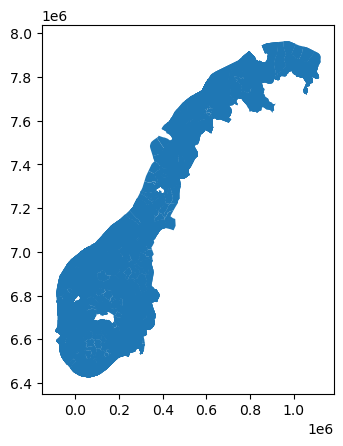

In [63]:
kommuner.sjoin(skoler).plot()

Man får også én rad per skole i kommunen:

In [64]:
# tell opp antall rader av hvert kommunenummer, det vil si antall skoler per kommune
kommuner.sjoin(skoler, how="left").KOMMUNENR.value_counts()

0301    152
4601    100
5001     71
4204     59
1103     57
       ... 
5046      1
4637      1
1825      1
5438      1
1145      1
Name: kommunenummer, Length: 356, dtype: int64

sjoin_nearest kan brukes for å finne avstand til nærmeste skole, og samtidig få kolonneinfoen, i dette tilfellet skolenavnet:

,traffic_per_day,speed_limit,roadtype,bridge,tunnel,municipality,geometry,traffic_per_km,skolenavn,meter_til_skole
4163,603.571325,30,K,0,0,0301,POINT (257693.200 6653982.598),30963.223407,Rudolf steinerskolen i Oslo,291.504746
1410,505.854358,30,K,0,0,0301,POINT (258273.840 6652980.946),1450.184477,Rudolf steinerskolen i Oslo,984.922160
3367,505.854358,30,K,0,0,0301,POINT (258004.573 6653307.041),8211.143021,Rudolf steinerskolen i Oslo,563.157932


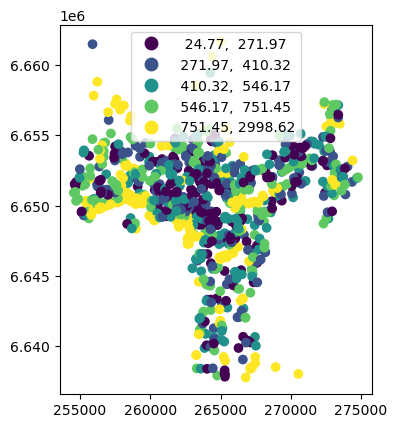

In [65]:
tilfeldige_punkter = veger.sample(1000)
tilfeldige_punkter["geometry"] = tilfeldige_punkter.centroid

joinet = tilfeldige_punkter.sjoin_nearest(skoler, 
                               distance_col="meter_til_skole").drop("index_right", axis=1)

joinet.plot("meter_til_skole", scheme="Quantiles", legend=True)
joinet.head(3)

Lag en kategorisk kolonne med ja/nei hvis mindre/mer enn 500 meter til nærmeste skole:

In [66]:
import numpy as np

<AxesSubplot: >

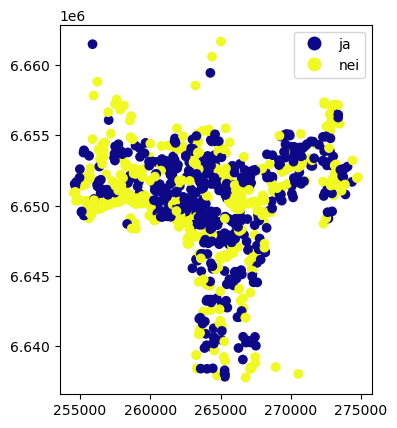

In [67]:
joinet["skole_innen_500m"] = np.where(joinet["meter_til_skole"] < 500, 
                                     "ja", 
                                     "nei")

joinet.plot("skole_innen_500m", cmap="plasma", legend=True)

### Overlay

Geopandas har en overlay-funksjon som gjør alt.

Man spesifiserer hvilken overlay man vil ha med 'how'-argumentet.

Intersection er default:

In [68]:
bufrede_punkter = tilfeldige_punkter.sample(100)
bufrede_punkter["geometry"] = bufrede_punkter.buffer(500)

# her finner vi overlappende veger
intersection = veger.overlay(bufrede_punkter) 
intersection.explore()

<AxesSubplot: >

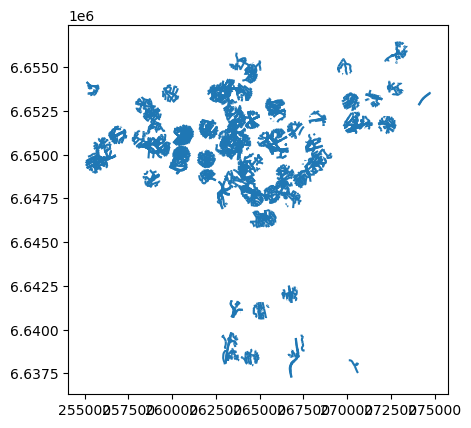

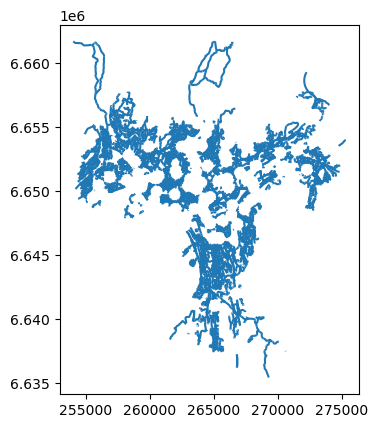

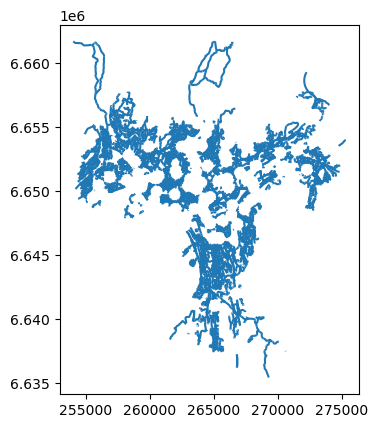

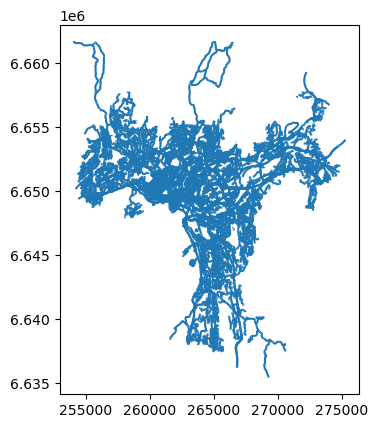

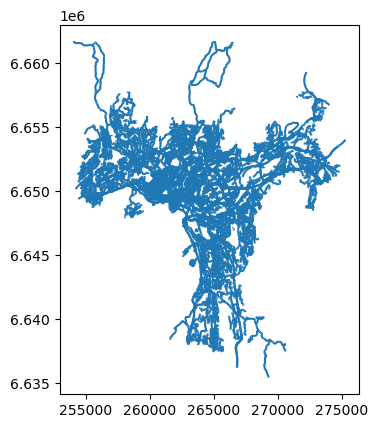

In [69]:
overlay1 = veger.overlay(bufrede_punkter, how = "intersection", keep_geom_type=True)
overlay1.plot()
overlay2 = veger.overlay(bufrede_punkter, how =  "difference", keep_geom_type=True) # = erase i ArcGIS
overlay2.plot()
overlay3 = veger.overlay(bufrede_punkter, how =  "symmetric_difference", keep_geom_type=True)
overlay3.plot()
overlay4 = veger.overlay(bufrede_punkter, how =  "identity", keep_geom_type=True)
overlay4.plot()
overlay5 = veger.overlay(bufrede_punkter, how =  "union", keep_geom_type=True)
overlay5.plot()

### Dissolve og til singlepart

Dette samler alle radene:

In [70]:
dissolvet = bufrede_punkter.dissolve()
dissolvet

,geometry,traffic_per_day,speed_limit,roadtype,bridge,tunnel,municipality,traffic_per_km
0,"MULTIPOLYGON (((259243.492 6648356.196, 259214...",302.906801,30,K,0,0,0301,19176.541326


Dette deler opp ikke-overlappende, altså fra multipolygon til polygon (multipart to singlepart):

In [71]:
singlepart = dissolvet.explode()
singlepart.explore()

C:\Users\ort\AppData\Local\Temp\ipykernel_11672\888147565.py:1: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  singlepart = dissolvet.explode()


Dissolve 'by' kolonner og få summen av kolonnene:

In [72]:
dissolvet = bufrede_punkter.dissolve(
    by = ["tunnel", "bridge"],
    aggfunc = "sum") # first er default

dissolvet

c:\Users\ort\Anaconda3\envs\geo_env311\Lib\site-packages\geopandas\geodataframe.py:1676: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  aggregated_data = data.groupby(**groupby_kwargs).agg(aggfunc)


geometry  \
tunnel bridge                                                      
0      0       MULTIPOLYGON (((263298.241 6647739.194, 263269...   
       1       MULTIPOLYGON (((263740.077 6639216.664, 263723...   
1      0       POLYGON ((262456.682 6649763.673, 262454.274 6...   
       1       MULTIPOLYGON (((262506.238 6648554.624, 262494...   

               traffic_per_day  speed_limit  traffic_per_km  
tunnel bridge                                                
0      0         671688.067235         3590    3.448187e+07  
       1         416226.181135          880    3.104823e+07  
1      0          11962.972194           50    1.274442e+06  
       1          90441.275630          280    5.640690e+06

Dette er det samme som pandas groupby + agg, bare at man da ikke får geometrien. Dette er som summary statistics i ArcGIS.

In [73]:
oppsummert_uten_geometri = (bufrede_punkter
             .groupby(["tunnel", "bridge"])
             .agg("sum")
            )
oppsummert_uten_geometri

C:\Users\ort\AppData\Local\Temp\ipykernel_11672\2554760868.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  .agg("sum")


traffic_per_day  speed_limit  traffic_per_km
tunnel bridge                                              
0      0         671688.067235         3590    3.448187e+07
       1         416226.181135          880    3.104823e+07
1      0          11962.972194           50    1.274442e+06
       1          90441.275630          280    5.640690e+06

#### Kort om index og feilmeldingene det fører til

Kolonnen(e) man dissolver 'by' eller bruker i groupby, blir til index for dataframen.

Når vi dissolver by tunnel og bridge, blir disse to en multiindex:

In [74]:
dissolvet.index

MultiIndex([(0, 0),
            (0, 1),
            (1, 0),
            (1, 1)],
           names=['tunnel', 'bridge'])

Og tunnel og brigde er ikke lenger kolonner:

In [75]:
dissolvet.columns

Index(['geometry', 'traffic_per_day', 'speed_limit', 'traffic_per_km'], dtype='object')

Vi kan få dem tilbake som kolonner med reset_index():

In [76]:
dissolvet = dissolvet.reset_index()
dissolvet

,tunnel,bridge,geometry,traffic_per_day,speed_limit,traffic_per_km
0,0,0,"MULTIPOLYGON (((263298.241 6647739.194, 263269...",671688.067235,3590,3.448187e+07
1,0,1,"MULTIPOLYGON (((263740.077 6639216.664, 263723...",416226.181135,880,3.104823e+07
2,1,0,"POLYGON ((262456.682 6649763.673, 262454.274 6...",11962.972194,50,1.274442e+06
3,1,1,"MULTIPOLYGON (((262506.238 6648554.624, 262494...",90441.275630,280,5.640690e+06


Hvis vi gjør det igjen nå som index er navnløs, får vi en kolonne kalt "index":

In [77]:
dissolvet = dissolvet.reset_index()
dissolvet

,index,tunnel,bridge,geometry,traffic_per_day,speed_limit,traffic_per_km
0,0,0,0,"MULTIPOLYGON (((263298.241 6647739.194, 263269...",671688.067235,3590,3.448187e+07
1,1,0,1,"MULTIPOLYGON (((263740.077 6639216.664, 263723...",416226.181135,880,3.104823e+07
2,2,1,0,"POLYGON ((262456.682 6649763.673, 262454.274 6...",11962.972194,50,1.274442e+06
3,3,1,1,"MULTIPOLYGON (((262506.238 6648554.624, 262494...",90441.275630,280,5.640690e+06


Og hvis enda en gang, får vi en index-kolonne for nivå 0:

In [78]:
dissolvet = dissolvet.reset_index()
dissolvet

,level_0,index,tunnel,bridge,geometry,traffic_per_day,speed_limit,traffic_per_km
0,0,0,0,0,"MULTIPOLYGON (((263298.241 6647739.194, 263269...",671688.067235,3590,3.448187e+07
1,1,1,0,1,"MULTIPOLYGON (((263740.077 6639216.664, 263723...",416226.181135,880,3.104823e+07
2,2,2,1,0,"POLYGON ((262456.682 6649763.673, 262454.274 6...",11962.972194,50,1.274442e+06
3,3,3,1,1,"MULTIPOLYGON (((262506.238 6648554.624, 262494...",90441.275630,280,5.640690e+06


Og hvis enda en reset_index, gir pandas opp: 

In [79]:
dissolvet = dissolvet.reset_index()
dissolvet

ValueError: cannot insert level_0, already exists

Vi kan fortsatt resette index uten å få det som en kolonne:

In [80]:
dissolvet = dissolvet.reset_index(drop=True)
dissolvet

,level_0,index,tunnel,bridge,geometry,traffic_per_day,speed_limit,traffic_per_km
0,0,0,0,0,"MULTIPOLYGON (((263298.241 6647739.194, 263269...",671688.067235,3590,3.448187e+07
1,1,1,0,1,"MULTIPOLYGON (((263740.077 6639216.664, 263723...",416226.181135,880,3.104823e+07
2,2,2,1,0,"POLYGON ((262456.682 6649763.673, 262454.274 6...",11962.972194,50,1.274442e+06
3,3,3,1,1,"MULTIPOLYGON (((262506.238 6648554.624, 262494...",90441.275630,280,5.640690e+06


Men alle disse index-kolonnene må vekk:

In [81]:
dissolvet = dissolvet.loc[:, ~dissolvet.columns.str.contains("index|level_")]
dissolvet

,tunnel,bridge,geometry,traffic_per_day,speed_limit,traffic_per_km
0,0,0,"MULTIPOLYGON (((263298.241 6647739.194, 263269...",671688.067235,3590,3.448187e+07
1,0,1,"MULTIPOLYGON (((263740.077 6639216.664, 263723...",416226.181135,880,3.104823e+07
2,1,0,"POLYGON ((262456.682 6649763.673, 262454.274 6...",11962.972194,50,1.274442e+06
3,1,1,"MULTIPOLYGON (((262506.238 6648554.624, 262494...",90441.275630,280,5.640690e+06


Index skaper også problemer i spatial join, siden denne returnerer en kolonne kalt "index_right":

In [82]:
dissolvet = dissolvet.sjoin(bufrede_punkter[["geometry"]])
dissolvet

,tunnel,bridge,geometry,traffic_per_day,speed_limit,traffic_per_km,index_right
0,0,0,"MULTIPOLYGON (((263298.241 6647739.194, 263269...",671688.067235,3590,3.448187e+07,1226
0,0,0,"MULTIPOLYGON (((263298.241 6647739.194, 263269...",671688.067235,3590,3.448187e+07,182
0,0,0,"MULTIPOLYGON (((263298.241 6647739.194, 263269...",671688.067235,3590,3.448187e+07,1144
1,0,1,"MULTIPOLYGON (((263740.077 6639216.664, 263723...",416226.181135,880,3.104823e+07,1144
0,0,0,"MULTIPOLYGON (((263298.241 6647739.194, 263269...",671688.067235,3590,3.448187e+07,12909
...,...,...,...,...,...,...,...
1,0,1,"MULTIPOLYGON (((263740.077 6639216.664, 263723...",416226.181135,880,3.104823e+07,11277
1,0,1,"MULTIPOLYGON (((263740.077 6639216.664, 263723...",416226.181135,880,3.104823e+07,10969
3,1,1,"MULTIPOLYGON (((262506.238 6648554.624, 262494...",90441.275630,280,5.640690e+06,10969
2,1,0,"POLYGON ((262456.682 6649763.673, 262454.274 6...",11962.972194,50,1.274442e+06,10190


Som gir feilmelding neste gang:

In [83]:
dissolvet = dissolvet.sjoin(bufrede_punkter[["geometry"]])
dissolvet

ValueError: 'index_left' and 'index_right' cannot be names in the frames being joined

#### Heldigvis kan man bare lage sine egne funksjoner:

In [84]:
def diss(gdf, **qwargs):
    """ dissolve som resetter index, fjerner index-kolonner og gjør kolonnenavn fra tuple til string"""
    
    dissolvet = gdf.dissolve(**qwargs)
    
    dissolvet = dissolvet.reset_index()
    
    # kolonner fra tuple til string
    dissolvet.columns = ["_".join(kolonne).strip("_") if isinstance(kolonne, tuple) else kolonne for kolonne in dissolvet.columns]

    # fjern index-kolonner
    dissolvet = dissolvet.loc[:, ~dissolvet.columns.str.contains('index|level_')]

    return dissolvet


def min_sjoin(gdf_left, gdf_right, **qwargs):
    
    left_kopi = gdf_left.loc[:, ~gdf_left.columns.str.contains('index|level_')]
    right_kopi = gdf_right.loc[:, ~gdf_right.columns.str.contains('index|level_')]
    
    joinet = left_kopi.sjoin(right_kopi, **qwargs)
    
    joinet = joinet.loc[:, ~joinet.columns.str.contains('index|level_')]
    
    return joinet

In [85]:
PandasObject.diss = diss
PandasObject.min_sjoin = min_sjoin

In [86]:
dissolvet = bufrede_punkter.diss(
    by = ["tunnel", "bridge"],
    aggfunc = ("sum", "mean"))

joinet = dissolvet.min_sjoin(bufrede_punkter[["geometry"]])

joinet.head(3)

c:\Users\ort\Anaconda3\envs\geo_env311\Lib\site-packages\geopandas\geodataframe.py:1676: FutureWarning: ['roadtype'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  aggregated_data = data.groupby(**groupby_kwargs).agg(aggfunc)


,tunnel,bridge,geometry,traffic_per_day_sum,traffic_per_day_mean,speed_limit_sum,speed_limit_mean,municipality_sum,municipality_mean,traffic_per_km_sum,traffic_per_km_mean
0,0,0,"MULTIPOLYGON (((263298.241 6647739.194, 263269...",671688.067235,8292.445275,3590,44.320988,0301030103010301030103010301030103010301030103...,inf,3.448187e+07,425702.100143
0,0,0,"MULTIPOLYGON (((263298.241 6647739.194, 263269...",671688.067235,8292.445275,3590,44.320988,0301030103010301030103010301030103010301030103...,inf,3.448187e+07,425702.100143
0,0,0,"MULTIPOLYGON (((263298.241 6647739.194, 263269...",671688.067235,8292.445275,3590,44.320988,0301030103010301030103010301030103010301030103...,inf,3.448187e+07,425702.100143


### buffer, dissolve og til singlepart (explode)

For å slippe å styre med index, reparering av geometri og lignende hver gang, er det greit med en funksjon:

In [87]:
def buffdissexp(gdf, avstand, resolution=50, **qwargs):

    kopi = gdf.copy()
        
    kopi["geometry"] = kopi.buffer(avstand, resolution=resolution).make_valid() #reparerer geometrien

    dissolvet = kopi.dissolve(**qwargs).reset_index()
    dissolvet = dissolvet.loc[:, ~dissolvet.columns.str.contains('index|level_')]

    dissolvet.columns = ["_".join(kolonne).strip("_") if isinstance(kolonne, tuple) else kolonne for kolonne in dissolvet.columns]

    singlepart = dissolvet.explode(ignore_index=True)

    return singlepart

Tette hull i polygoner:

In [88]:
import pygeos

def tett_hull(gdf):

    from shapely.ops import unary_union
    
    def tett_radvis(x):
        x = pygeos.from_shapely(x)
        hull_tettet = pygeos.polygons(pygeos.get_exterior_ring(pygeos.get_parts(x)))
        return unary_union(pygeos.to_shapely(hull_tettet))
    
    kopi = gdf.copy(deep=True)
    kopi["geometry"] = kopi.geometry.map(tett_radvis)

    return kopi

In [89]:
PandasObject.buffdissexp = buffdissexp
PandasObject.tett_hull = tett_hull

Man kan fordele funksjoner på flere linjer hvis man har parentes rundt:

<AxesSubplot: >

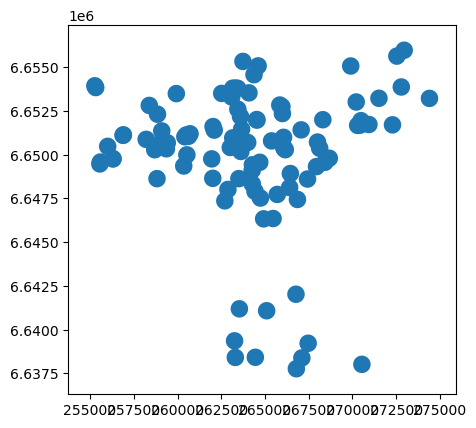

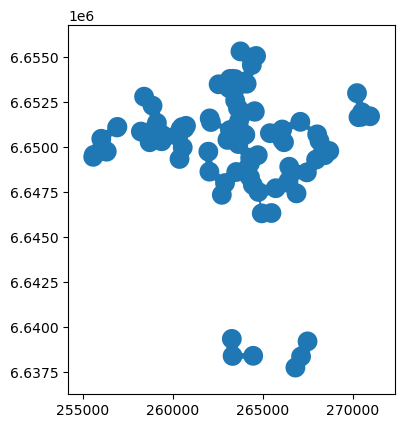

In [90]:
veger_buffutinn = (bufrede_punkter
                    .buff(25)
                    .buff(25)
                    .buff(25)
                    .buff(25)
                    .buffdissexp(12.5)
                    .buffdissexp(-12.5)
                    .buffdissexp(-50)
                    .buffdissexp(5)
                    .buffdissexp(-5)
                    .tett_hull()
                    .buffdissexp(-1)
                    .buffdissexp(1)
                    .query("geometry.area > 2000000")
                  )
bufrede_punkter.plot()
veger_buffutinn.plot()

### mer om tett_hull()

En mer fleksibel variant ligger her:

In [91]:
import geopandas as gpd
import sys
sys.path.append(r"C:\Users\ort\OneDrive - Statistisk sentralbyrå\Dokumenter\GitHub")

import geopandasgreier as gg
gg.tett_hull

<function geopandasgreier.buffer_dissolve_explode.tett_hull(geom, max_km2=None)>

Her kan man tette hull under en viss størrelse:

<AxesSubplot: >

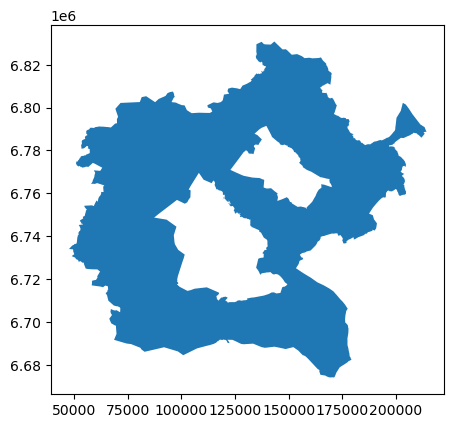

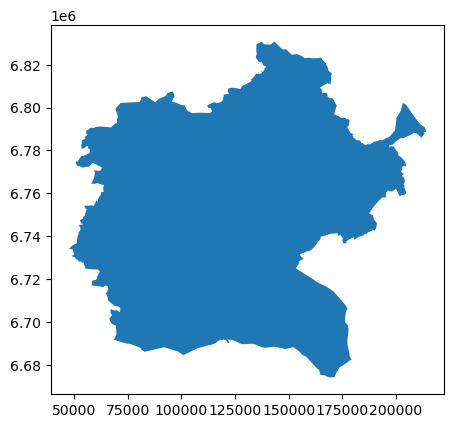

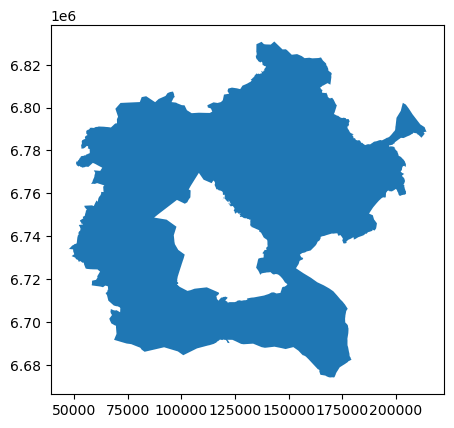

In [95]:
import kommfylk
naboer_hol = kommfylk.nabokommuner("3044", aar=2022)
naboer_hemsedal = kommfylk.nabokommuner("3042", aar=2022)
naboer_hol_og_hemsedal = kommuner[kommuner.KOMMUNENR.isin(naboer_hol+naboer_hemsedal)].diss()

naboer_hol_og_hemsedal.plot()

naboer_hol_og_hemsedal.tett_hull(max_km2 = 1000).plot()

naboer_hol_og_hemsedal.tett_hull().plot() # tetter alle hull

### Mer om dissolve()

Hvis vi vil ha ulike og/eller flere aggregeringsfunksjoner, kan vi gjøre sånn:

In [ ]:
dissolvet = bufrede_punkter.dissolve(
    
    by = ["bridge", "tunnel"], 
    
    # aggregerings i ordbok (dictionary)
    aggfunc = {"municipality": "first",
               "roadtype": ["count"], 
               "speed_limit": ["sum", np.mean],
               "traffic_per_day": (np.sum, "mean"),
              }
)

dissolvet = dissolvet.reset_index()

dissolvet

,bridge,tunnel,geometry,"(municipality, first)","(roadtype, count)","(speed_limit, sum)","(speed_limit, mean)","(traffic_per_day, sum)","(traffic_per_day, mean)"
0,0,0,"MULTIPOLYGON (((263081.669 6647534.319, 263052...",3024,85,3810,44.823529,755233.475897,8885.099716
1,1,0,"MULTIPOLYGON (((263938.043 6641150.270, 263921...",0301,14,790,56.428571,437958.870699,31282.776479
2,1,1,"POLYGON ((261565.334 6649235.793, 261562.926 6...",0301,1,50,50.000000,7070.262273,7070.262273


Liten avsporing om pythons innebygde sum-funksjon. Denne funker ikke om man har ett tall:

In [ ]:
print(sum([1,2]))
print(sum(1))

3


TypeError: 'int' object is not iterable

Men det gjør numpy.sum:

In [ ]:
print(np.sum([1,2]))
print(np.sum(1))

3
1


#### kolonner fra tuple til string

Når man dissolver 'by' flere kolonner, får man dumme kolonnenavn i tuple, fx (municipality, first):

In [ ]:
dissolvet

,bridge,tunnel,geometry,"(municipality, first)","(roadtype, count)","(speed_limit, sum)","(speed_limit, mean)","(traffic_per_day, sum)","(traffic_per_day, mean)"
0,0,0,"MULTIPOLYGON (((263081.669 6647534.319, 263052...",3024,85,3810,44.823529,755233.475897,8885.099716
1,1,0,"MULTIPOLYGON (((263938.043 6641150.270, 263921...",0301,14,790,56.428571,437958.870699,31282.776479
2,1,1,"POLYGON ((261565.334 6649235.793, 261562.926 6...",0301,1,50,50.000000,7070.262273,7070.262273


Jeg vil ha kolonnene som tekst, altså municipality_first:

In [ ]:
for kolonne in dissolvet.columns:
    if isinstance(kolonne, tuple):
        dissolvet = dissolvet.rename(columns = {kolonne: "_".join(kolonne).strip("_")})

dissolvet

,bridge,tunnel,geometry,municipality_first,roadtype_count,speed_limit_sum,speed_limit_mean,traffic_per_day_sum,traffic_per_day_mean
0,0,0,"MULTIPOLYGON (((263081.669 6647534.319, 263052...",3024,85,3810,44.823529,755233.475897,8885.099716
1,1,0,"MULTIPOLYGON (((263938.043 6641150.270, 263921...",0301,14,790,56.428571,437958.870699,31282.776479
2,1,1,"POLYGON ((261565.334 6649235.793, 261562.926 6...",0301,1,50,50.000000,7070.262273,7070.262273


Samme i list comprehension (kortere og raskere):

In [ ]:
dissolvet.columns = ["_".join(kolonne).strip("_") if isinstance(kolonne, tuple) else kolonne for kolonne in dissolvet.columns]
dissolvet

,tunnel,bridge,geometry,traffic_per_day,speed_limit,traffic_per_km
0,0,0,"MULTIPOLYGON (((256136.309 6648870.452, 256132...",3.128495e+06,18150,1.694940e+08
1,0,1,"MULTIPOLYGON (((263830.318 6639620.916, 263827...",1.301961e+06,3100,1.250595e+08
2,1,0,"MULTIPOLYGON (((263465.054 6647811.845, 263463...",1.548511e+05,430,1.033243e+07
3,1,1,"MULTIPOLYGON (((265912.830 6647128.348, 265911...",3.837181e+05,560,3.566651e+07


Som er det som gjøres i diss-funksjonen over:

In [ ]:
dissolvet = bufrede_punkter.diss(
    
                 by = ["bridge", "tunnel"],
    
                 aggfunc = {"municipality": "first", 
                            "speed_limit": ["sum","mean"],
                            "traffic_per_day": ["sum","mean"]
                           }
)
dissolvet

,bridge,tunnel,geometry,municipality_first,speed_limit_sum,speed_limit_mean,traffic_per_day_sum,traffic_per_day_mean
0,0,0,"MULTIPOLYGON (((256136.309 6648870.452, 256132...",0301,18150,41.533181,3.128495e+06,7159.027421
1,0,1,"MULTIPOLYGON (((263465.054 6647811.845, 263463...",3024,430,61.428571,1.548511e+05,22121.588637
2,1,0,"MULTIPOLYGON (((263830.318 6639620.916, 263827...",0301,3100,64.583333,1.301961e+06,27124.186180
3,1,1,"MULTIPOLYGON (((265912.830 6647128.348, 265911...",0301,560,70.000000,3.837181e+05,47964.767054


### Eksempel på bruk av ordbok

Lag ordbok med kommunenes naboer.

In [ ]:
abas = gpd.read_file(r"C:\Users\ort\OneDrive - Statistisk sentralbyrå\data\Basisdata_0000_Norge_25833_Kommuner_FGDB.gdb", 
                         layer="kommune")
abas["KOMMUNENR"] = abas.kommunenummer
abas = abas.sort_values("KOMMUNENR")
veger["KOMMUNENR"] = veger.municipality

In [ ]:
naboordbok = {}
for kommune in abas.KOMMUNENR:

    #spatial join mellom kommunen og alle andre andre kommuner
    kommunen = abas.loc[abas.KOMMUNENR == kommune, ["geometry"]]
    andre_kommuner = abas.loc[abas.KOMMUNENR != kommune, ["KOMMUNENR", "geometry"]]
    joinet = kommunen.sjoin(andre_kommuner)

    # gjør liste over unike kommunenumre til value og kommunen til key
    naboer = list(joinet.KOMMUNENR.unique())
    naboordbok[kommune] = naboer

naboordbok["0301"]

['3020', '3023', '3024', '3054', '3007', '3028', '3029', '3030', '3031']

Hvis man trenger data for nabokommuner, kan man loope gjennom naboordboka

In [ ]:
for kommnr, naboer in naboordbok.items():
    relevante_veger = veger[(veger["KOMMUNENR"]==kommnr) | (veger["KOMMUNENR"].isin(naboer))]

### pandas map: radvis manipulering av kolonneverdier

Utrolig anvendelig metode.

Basert på Pythons innebygde map-funksjon:

In [ ]:
liste_tekst = ['1', '2', '3', '4', '5']

# gjør om tekst til tall:
liste_integers = map(int, liste)

list(liste_integers)

[3401, 1101, 1103, 1106, 1108]

In [ ]:
# gjør om tekst til tall:
veger["KOMMUNENR_int"] = veger["KOMMUNENR"].map(int)
veger["KOMMUNENR_int"]

0        301
1        301
2        301
3        301
4        301
        ... 
13226    301
13227    301
13228    301
13229    301
13230    301
Name: KOMMUNENR_int, Length: 13231, dtype: int64

pandas map godtar også funksjoner:

In [ ]:
kommnr_funksjon = lambda x: str(int(x)).zfill(4)

veger["KOMMUNENR"] = veger["KOMMUNENR_int"].map(kommnr_funksjon)
veger["KOMMUNENR"]

0        0301
1        0301
2        0301
3        0301
4        0301
         ... 
13226    0301
13227    0301
13228    0301
13229    0301
13230    0301
Name: KOMMUNENR, Length: 13231, dtype: object

In [ ]:
def funksjon(verdi):
    if verdi<40:
        return "<40"
    if verdi<60:
        return "<60"
    if verdi<80:
        return "<80"
    return "80+"
    
veger["fartsgrense_kategorier"] = veger["speed_limit"].map(funksjon)
veger["fartsgrense_kategorier"]

0        <40
1        <40
2        <40
3        <40
4        <40
        ... 
13226    80+
13227    80+
13228    <60
13229    <60
13230    <60
Name: fartsgrense_kategorier, Length: 13231, dtype: object

Man kan også gjøre GIS-greier, for eksempel som i tett_hull-funksjonen over.

In [ ]:
def tett_radvis(x):
    import pygeos
    from shapely.ops import unary_union
    x = pygeos.from_shapely(x)
    hull_tettet = pygeos.polygons(pygeos.get_exterior_ring(pygeos.get_parts(x)))
    return unary_union(pygeos.to_shapely(hull_tettet))
    
kommuner["geometry"] = kommuner.geometry.map(tett_radvis)

Man kan også gjøre pandas-aggregering inni map, og få resultatet som en kolonne i den ikke-aggregerte dataframen.

En aggregering er å telle opp antall, f.eks. antall av hver vegtype:

In [ ]:
veger.roadtype.value_counts()

K    9834
E    1636
R    1521
F     240
Name: roadtype, dtype: int64

Hvis man plasserer dette inni map, får man en kolonne hvor tallene over fordeles til riktige rader basert på vegtypen:

In [ ]:
veger["antall_vegtype"] = veger.roadtype.map(veger.roadtype.value_counts())
veger

,traffic_per_day,speed_limit,roadtype,bridge,tunnel,municipality,geometry,traffic_per_km,KOMMUNENR,KOMMUNENR_int,fartsgrense_kategorier,nabokommuner,antall_vegtype
0,5.086812,30,K,0,0,0301,"LINESTRING (264428.800 6660601.970, 264426.510...",6.173991e+01,0301,301,<40,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",9834
1,10.173623,30,K,0,0,0301,"LINESTRING (265904.131 6644537.702, 265942.621...",2.638761e+02,0301,301,<40,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",9834
2,10.096893,30,K,0,0,0301,"LINESTRING (261473.700 6650780.800, 261477.060...",1.379051e+02,0301,301,<40,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",9834
3,1.017362,30,K,0,0,0301,"LINESTRING (270551.267 6651700.294, 270557.649...",3.075737e+01,0301,301,<40,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",9834
4,10.173623,30,K,0,0,0301,"LINESTRING (256149.500 6650711.400, 256159.700...",2.381416e+02,0301,301,<40,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",9834
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13226,98578.000000,80,E,1,0,0301,"LINESTRING (270398.124 6651558.120, 270410.319...",5.431277e+06,0301,301,80+,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",1636
13227,98578.000000,80,E,1,0,0301,"LINESTRING (270413.502 6651546.876, 270418.669...",5.524680e+06,0301,301,80+,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",1636
13228,127801.000000,50,R,0,0,0301,"LINESTRING (260769.400 6649207.600, 260770.848...",1.544197e+06,0301,301,<60,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",1521
13229,127801.000000,50,R,0,0,0301,"LINESTRING (260847.878 6649214.850, 260845.650...",1.415853e+06,0301,301,<60,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",1521


Man kan også bruke groupby og aggregere for eksempel gjennomsnittlig trafikkmengde per vegtype.

Man må returnere en kolonne, ikke en hel dataframe for at map skal godta det.

In [ ]:
veger["avg_traffic_roadtype"] = veger.roadtype.map(
    veger.groupby("roadtype").mean()["traffic_per_day"]
    )
veger

C:\Users\ort\AppData\Local\Temp\ipykernel_22160\2259505722.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  veger.groupby("roadtype").mean()["traffic_per_day"]


,traffic_per_day,speed_limit,roadtype,bridge,tunnel,municipality,geometry,traffic_per_km,KOMMUNENR,KOMMUNENR_int,fartsgrense_kategorier,nabokommuner,antall_vegtype,avg_traffic_roadtype
0,5.086812,30,K,0,0,0301,"LINESTRING (264428.800 6660601.970, 264426.510...",6.173991e+01,0301,301,<40,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",9834,3668.210912
1,10.173623,30,K,0,0,0301,"LINESTRING (265904.131 6644537.702, 265942.621...",2.638761e+02,0301,301,<40,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",9834,3668.210912
2,10.096893,30,K,0,0,0301,"LINESTRING (261473.700 6650780.800, 261477.060...",1.379051e+02,0301,301,<40,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",9834,3668.210912
3,1.017362,30,K,0,0,0301,"LINESTRING (270551.267 6651700.294, 270557.649...",3.075737e+01,0301,301,<40,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",9834,3668.210912
4,10.173623,30,K,0,0,0301,"LINESTRING (256149.500 6650711.400, 256159.700...",2.381416e+02,0301,301,<40,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",9834,3668.210912
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13226,98578.000000,80,E,1,0,0301,"LINESTRING (270398.124 6651558.120, 270410.319...",5.431277e+06,0301,301,80+,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",1636,36630.888655
13227,98578.000000,80,E,1,0,0301,"LINESTRING (270413.502 6651546.876, 270418.669...",5.524680e+06,0301,301,80+,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",1636,36630.888655
13228,127801.000000,50,R,0,0,0301,"LINESTRING (260769.400 6649207.600, 260770.848...",1.544197e+06,0301,301,<60,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",1521,22480.412288
13229,127801.000000,50,R,0,0,0301,"LINESTRING (260847.878 6649214.850, 260845.650...",1.415853e+06,0301,301,<60,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303...",1521,22480.412288


Man kan også bruke en ordbok inni map, hvis nøklene matcher med kolonneverdiene:

In [ ]:
veger["nabokommuner"] = veger.KOMMUNENR.map(naboordbok)
veger[["KOMMUNENR", "nabokommuner"]]

,KOMMUNENR,nabokommuner
0,0301,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303..."
1,0301,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303..."
2,0301,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303..."
3,0301,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303..."
4,0301,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303..."
...,...,...
13226,0301,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303..."
13227,0301,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303..."
13228,0301,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303..."
13229,0301,"[3020, 3023, 3024, 3054, 3007, 3028, 3029, 303..."


### Enda mer om dissolve()
Hvis man har mange kolonner og vil ha 'sum' hvis numerisk og 'first' ellers:

In [ ]:
# dictionary comprehension hvor kolonnenavnet er key og aggregeringsfunksjonen er value
aggfunc = {kolonne: "sum" 
           if pd.api.types.is_numeric_dtype(bufrede_punkter[kolonne]) 
           else "first" 
           for kolonne in bufrede_punkter.columns}

aggfunc

{'traffic_per_day': 'sum',
 'speed_limit': 'sum',
 'roadtype': 'first',
 'bridge': 'sum',
 'tunnel': 'sum',
 'municipality': 'first',
 'geometry': 'first',
 'traffic_per_km': 'sum'}

Man må også fjerne kolonnene som dissolves 'by' og geometri-kolonnen fra ordboka:

In [ ]:
by = ["bridge", "tunnel"]

aggfunc = {kolonne: "sum" if pd.api.types.is_numeric_dtype(bufrede_punkter[kolonne]) else "first" for kolonne in bufrede_punkter.columns # denne linja er samme som over
           if kolonne!="geometry" and kolonne not in by}

aggfunc

{'traffic_per_day': 'sum',
 'speed_limit': 'sum',
 'roadtype': 'first',
 'municipality': 'first',
 'traffic_per_km': 'sum'}

In [ ]:
dissolvet = bufrede_punkter.diss(

                 by = by,
    
                 aggfunc = aggfunc
)
dissolvet

,bridge,tunnel,geometry,traffic_per_day,speed_limit,roadtype,municipality,traffic_per_km
0,0,0,"MULTIPOLYGON (((263081.669 6647534.319, 263052...",755233.475897,3810,K,3024,7.024656e+07
1,1,0,"MULTIPOLYGON (((263938.043 6641150.270, 263921...",437958.870699,790,K,0301,5.314573e+07
2,1,1,"POLYGON ((261565.334 6649235.793, 261562.926 6...",7070.262273,50,E,0301,2.257883e+06
